In [204]:
import scanpy as sc
import sklearn
import numpy as np
import random
random.seed(17)
np.random.seed(17)

In [ ]:
adata = sc.read_h5ad(r"10D_GAA_sce.h5ad") 

adata.layers["counts"] = adata.X
adata = adata[adata.obs['scDblFinder.class'] == 'singlet']

sc.pp.highly_variable_genes(adata, flavor ="seurat_v3", subset=False)
sc.pp.log1p(adata)

adata.obs['n_counts'] = adata.layers["counts"].sum(axis=1)

#sc.pp.regress_out(adata, ['n_counts'])  # remove depth effect

sc.tl.pca(adata)
#sc.pp.neighbors(adata)
#sc.tl.umap(adata)

#sc.pl.umap(adata, color = ["vas", "Fas3", "tj", "ct", "Ilp8", "Ilp6"], ncols=1)


c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:172: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


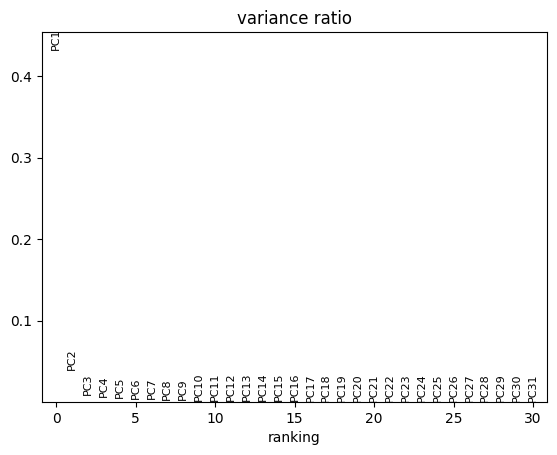

In [193]:
sc.pl.pca_variance_ratio(adata)

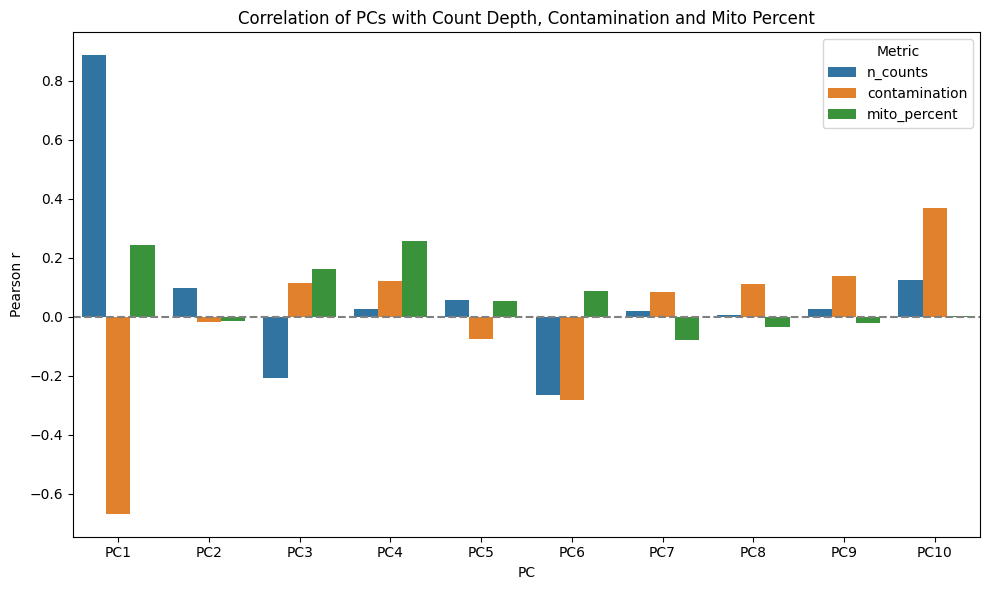

In [ ]:
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

X_pca = adata.obsm["X_pca"]
pc_df = pd.DataFrame(X_pca[:, :10], columns=[f'PC{i+1}' for i in range(10)])

pc_df['n_counts'] = adata.obs['n_counts'].values

pc_df['contamination'] = adata.obs['decontX_contamination'].values

pc_df['mito_percent'] = adata.obs['subsets_Mito_percent'].values

pc_df = pc_df.replace([np.inf, -np.inf], np.nan).dropna()

results = []
for metric in ['n_counts', 'contamination','mito_percent']:
    for pc in [f'PC{i+1}' for i in range(10)]:
        corr, pval = stats.pearsonr(pc_df[pc], pc_df[metric])
        results.append({'PC': pc, 'Metric': metric, 'Correlation': corr, 'p-value': pval})

results_df = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
sns.barplot(data=results_df, x='PC', y='Correlation', hue='Metric')
plt.axhline(0, color='gray', linestyle='--')
plt.title('Correlation of PCs with Count Depth, Contamination and Mito Percent')
plt.ylabel('Pearson r')
plt.tight_layout()
plt.show()


In [207]:
import scanpy as sc

sc.pp.regress_out(adata, ['n_counts', 'subsets_Mito_percent', 'decontX_contamination'])
sc.tl.pca(adata)

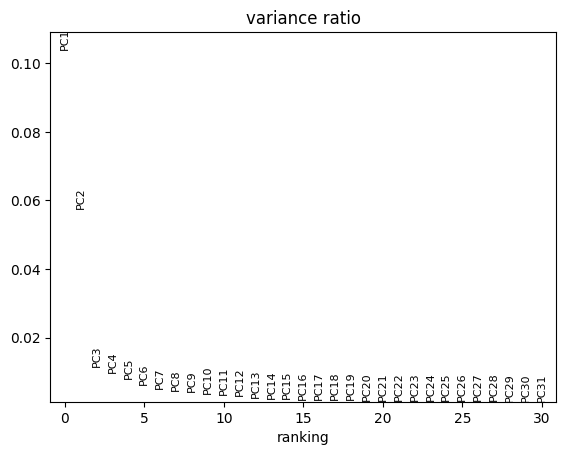

In [208]:
sc.pl.pca_variance_ratio(adata, log=False)

In [187]:
var_ratio = adata.uns['pca']['variance_ratio']

from kneed import KneeLocator

kl = KneeLocator(
    range(1, len(var_ratio) + 1),
    var_ratio,
    curve='convex',
    direction='decreasing'
)

print(f"Elbow found at PC: {kl.knee}")


Elbow found at PC: 5


In [189]:
sum(var_ratio[:5])

0.1937259100084734

In [209]:
from pyclustree import clustree
import matplotlib.pyplot as plt

sc.pp.neighbors(adata, n_pcs=50)

resolutions = [0.1, 0.5, 1.0, 1.5, 2.0, 5.0]
for r in resolutions:
    key = f"leiden_{str(r).replace('.', '_')}"
    sc.tl.leiden(adata, resolution=r, key_added=key)

cluster_cols = [f"leiden_{str(r).replace('.', '_')}" for r in resolutions]

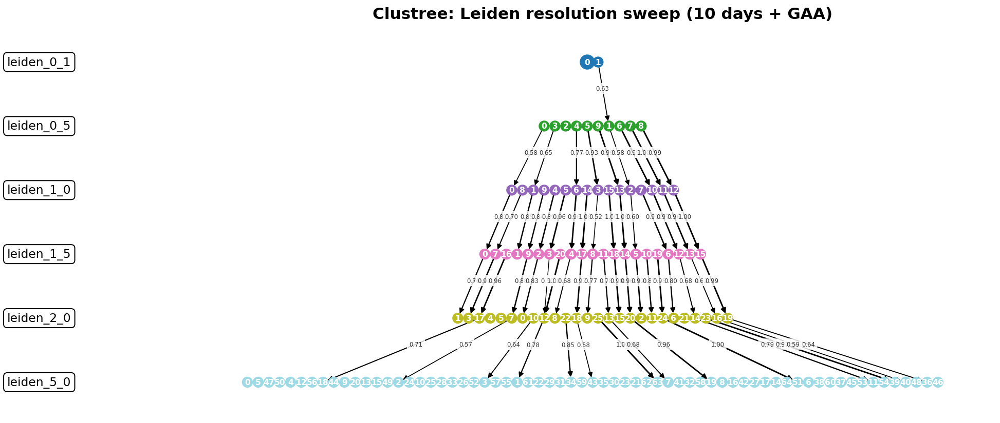

In [ ]:
fig = clustree(
    adata,
    cluster_cols,
    title="Clustree: Leiden resolution sweep (10 days + GAA)",
    edge_weight_threshold=0.5,  
    node_size_range=(100, 200),
    edge_width_range=(0.0, 1.5),
    show_fraction=True
)

fig.set_size_inches(14, 6)
fig.set_dpi(140)
plt.tight_layout()
plt.show()

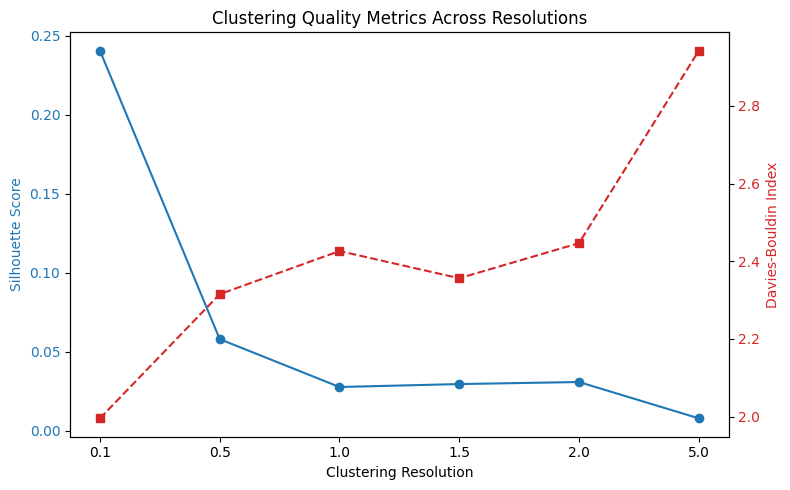

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, davies_bouldin_score
import numpy as np
import pandas as pd

X = adata.obsm["X_pca"][:, :50]

silhouette_scores = []
db_scores = []

for key in cluster_cols:
    labels = adata.obs[key].astype(int)
    silhouette = silhouette_score(X, labels)
    db = davies_bouldin_score(X, labels)
    silhouette_scores.append(silhouette)
    db_scores.append(db)

df_scores = pd.DataFrame({
    'Resolution': [str(r) for r in resolutions],
    'Silhouette Score': silhouette_scores,
    'Davies-Bouldin Index': db_scores
})

fig, ax1 = plt.subplots(figsize=(8, 5))

color = 'tab:blue'
ax1.set_xlabel('Clustering Resolution')
ax1.set_ylabel('Silhouette Score', color=color)
ax1.plot(df_scores['Resolution'], df_scores['Silhouette Score'], marker='o', color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Davies-Bouldin Index', color=color)
ax2.plot(df_scores['Resolution'], df_scores['Davies-Bouldin Index'], marker='s', linestyle='--', color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Clustering Quality Metrics Across Resolutions')
fig.tight_layout()
plt.show()

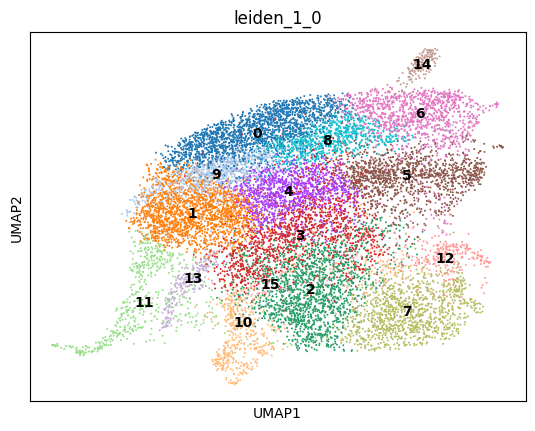

In [210]:
sc.tl.umap(adata, random_state=17)

sc.pl.umap(adata, color=["leiden_1_0"], legend_loc="on data")

In [174]:
marker_dictionary = {"escort_cells" : ["CG9674", "GstS1", "Wnt4", "fax", "fz3", "ptc", "Brd", "CG13465", "Tom", "BobA", "E(spl)mgamma-HLH", "CG4440", "Ama"],
                    "adult tracheocyte" : ["Antp", "Gasp", "Nplp4", "Ubx", "btl", "ect", "sano", "trh", "vvl", "wat"],
                    "polar follicle cell" : ["cas", "upd1", "upd3"],
                    "16-cell germline cyst in germarium region 2a and 2b" : ["lncRNA:CR45667", "lncRNA:CR45666", "lncRNA:CR45665", "asRNA:CR45481", "lncRNA:CR32730", "asRNA:CR45715", "Alp1", "lncRNA:CR44357", "CG14423", "lncRNA:CR46148"],
                    "choriogenic main body follicle cell and corpus luteum" : ["Diap1", "Ilp8"],
                    "dorsal appendage forming follicle cell" : ["Ance", "CG42867", "if"],
                    "follicle stem cell and prefollicle cell" : ["Wnt4", "cas", "eya", "sick"],
                    "germ cell stage 4 and later" : ["Rbfox1"],
                    "germline cell, unknown stage" : ["BigH1", "bru1", "orb", "pgc"],
                    "ovarian sheath muscle" : ["Act57B", "Mhc", "Mlc2", "Mlp60A", "Mlp84B"],
                    "oviduct" : ["abd-A", "vir-1"],
                    "post-mitotic endocycling nurse cell" : ["CycE"],
                    "post-mitotic germ cell early 16-cell cyst" : ["orb"],
                    "stalk follicle cell" : ["CG46339", "cas", "drl", "zfh1"],
                    "stretch follicle cell" : ["cv-2", "dpp"],
                    "young germ cell" : ["Myc", "Sxl", "bam", "ovo", "vas"],
                    "central main body follicle cell ca. St. 6-8" : ["Yp1", "br", "mirr"],
                    "choriogenic main body follicle cell St. 12" : ["senju", "yellow-g", "yellow-g2"],
                    "choriogenic main body follicle cell St. 14" : ["Acer", "CG31926", "Femcoat"],
                    "main body follicle cell ca. until St. 5" : ["CadN", "Fas2", "eya"],
                    "posterior terminal follicle cell ca. St. 5-8" : ["mid", "pnt"],
                    
                    }


ESCORT_CELLS:



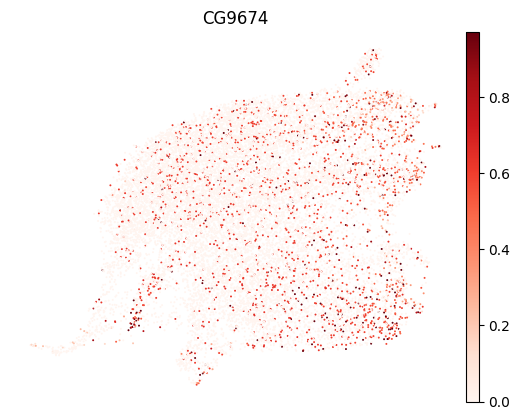

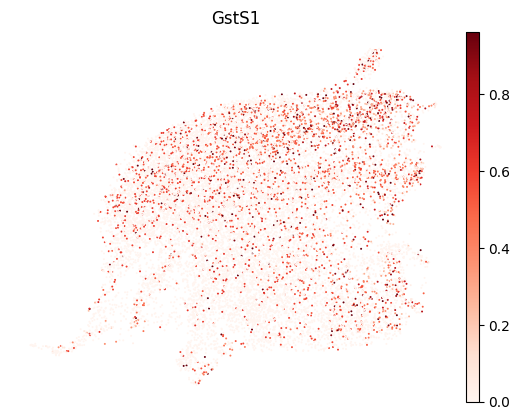

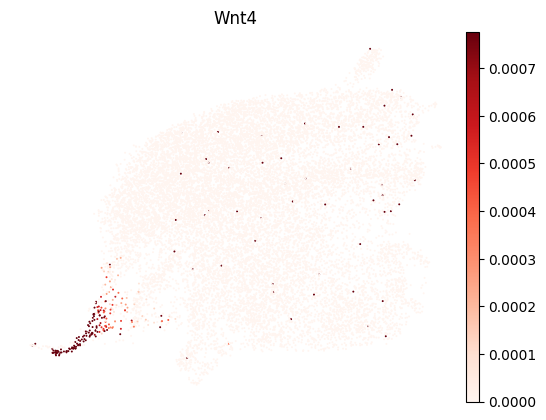

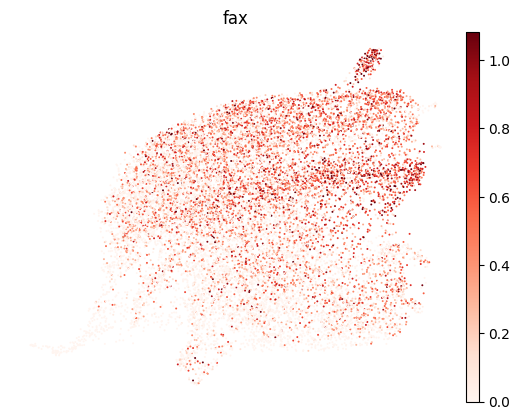

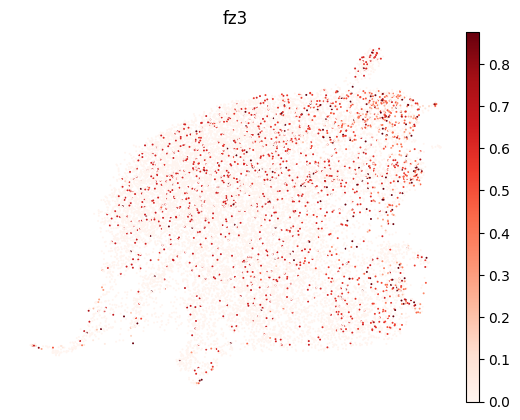

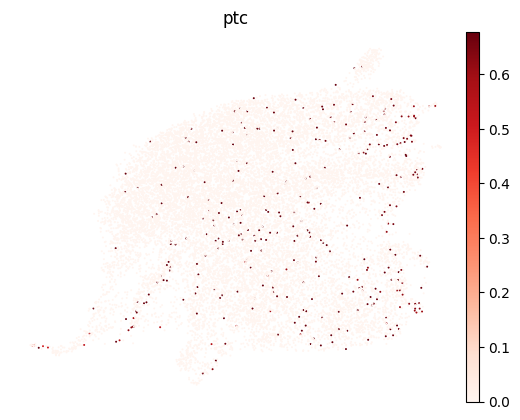

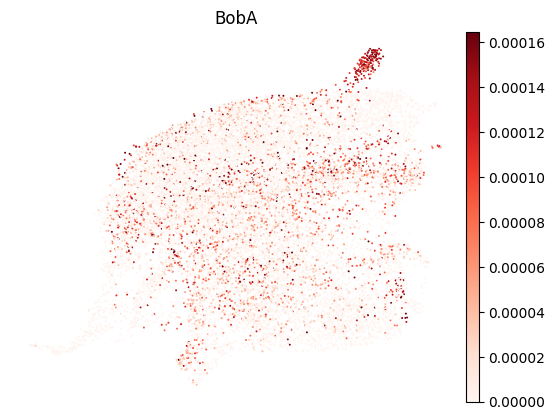

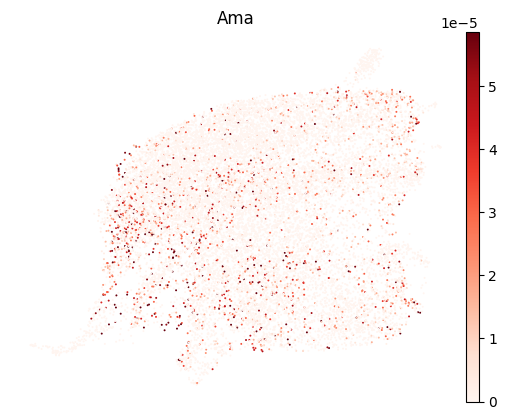






ADULT TRACHEOCYTE:



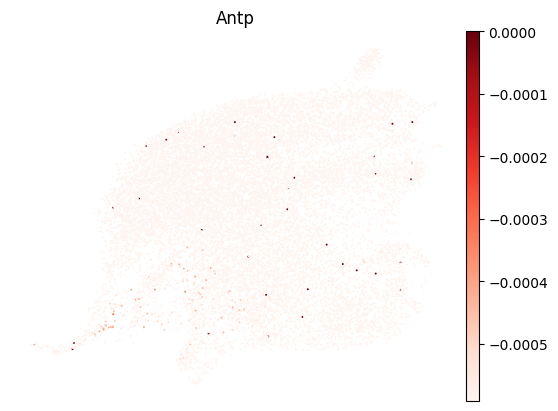

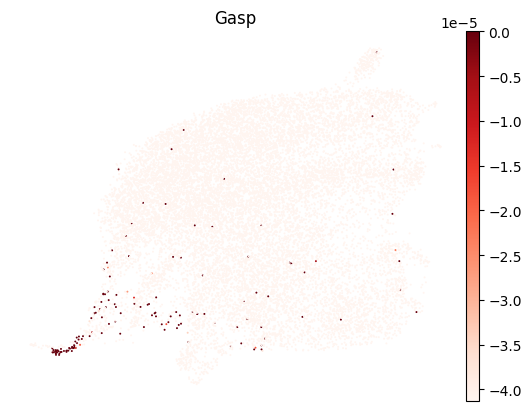

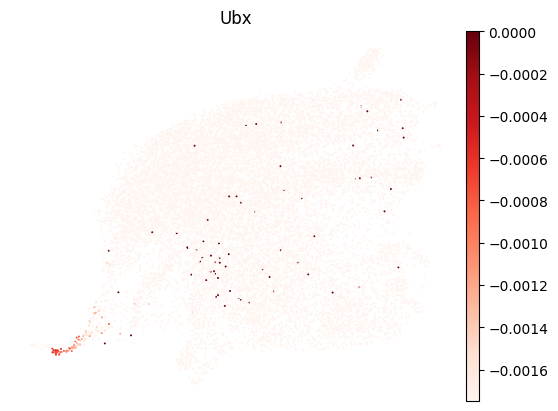

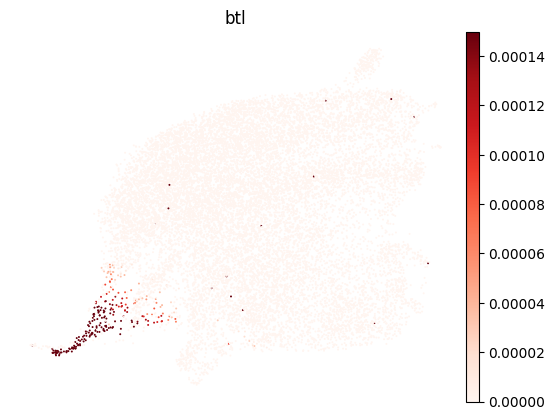

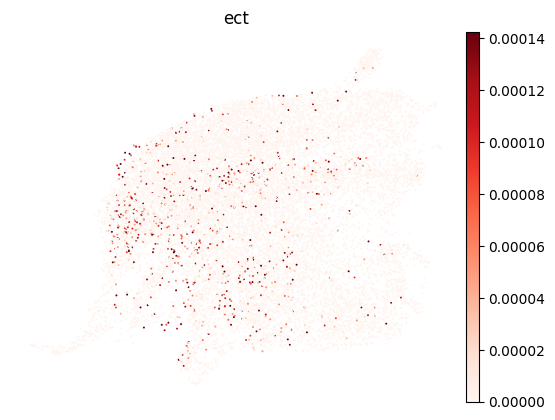

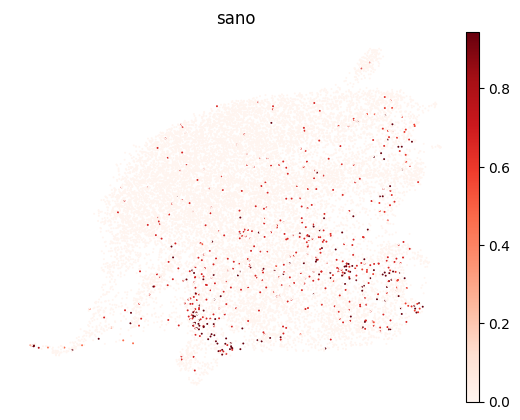

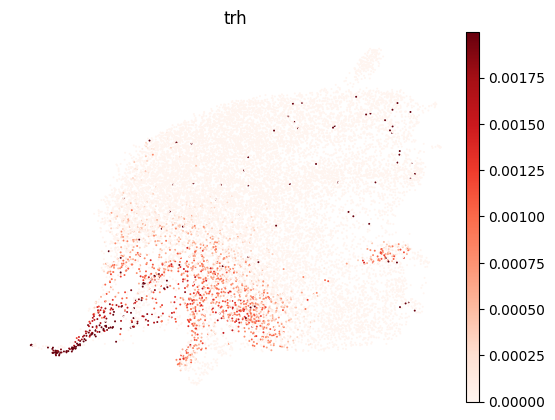

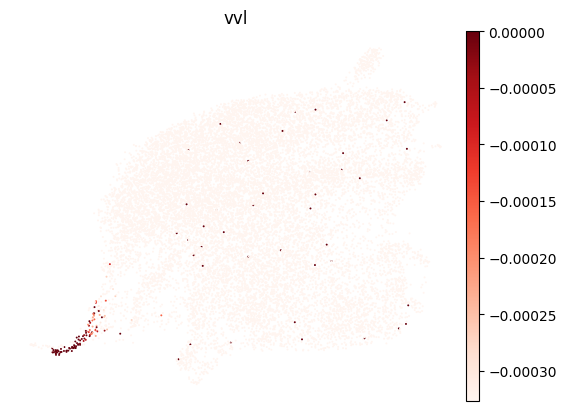

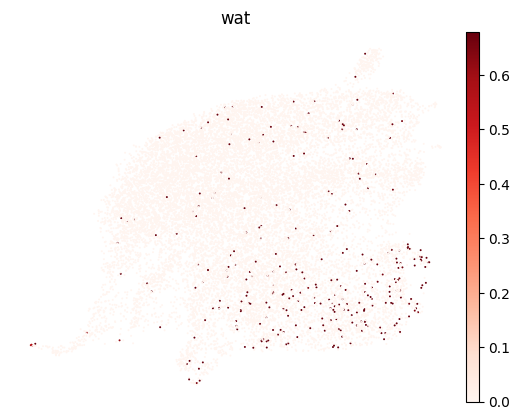






POLAR FOLLICLE CELL:



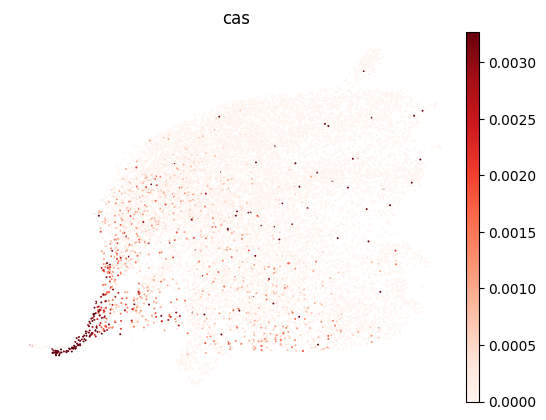

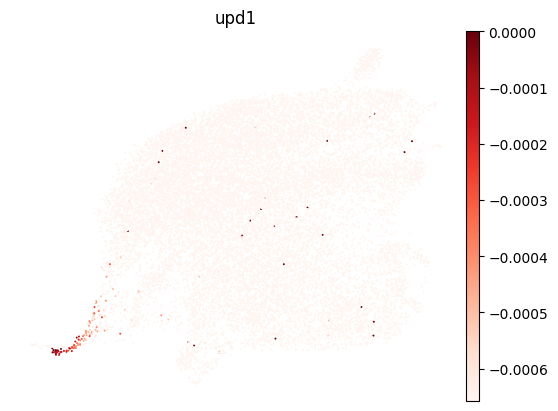

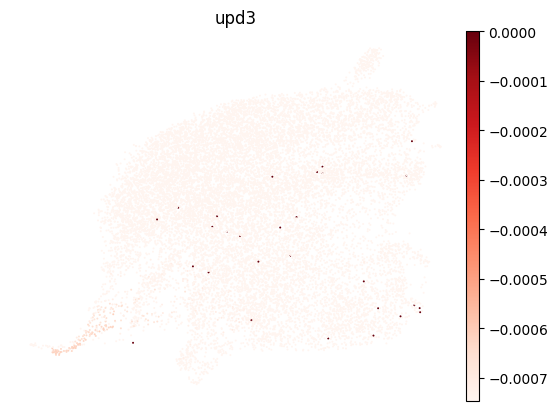






16-CELL GERMLINE CYST IN GERMARIUM REGION 2A AND 2B:



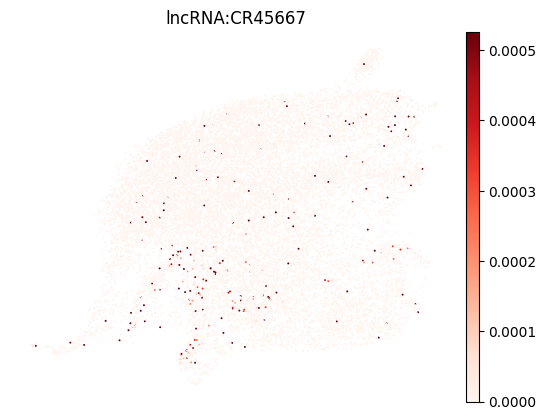

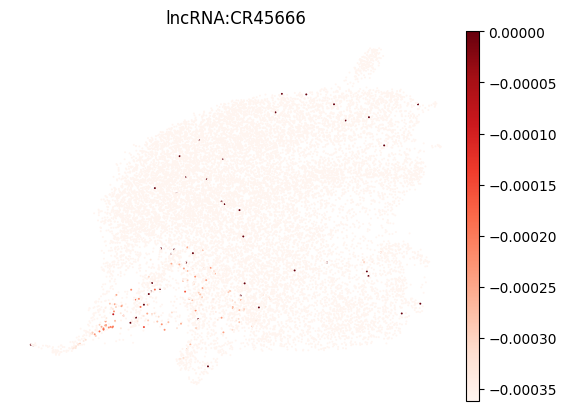

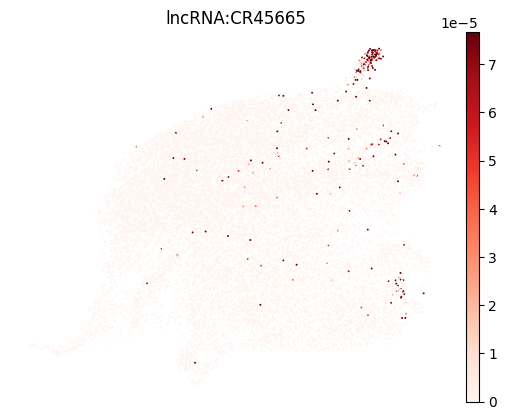

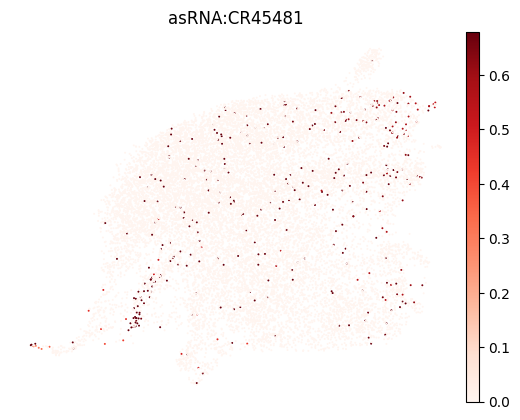

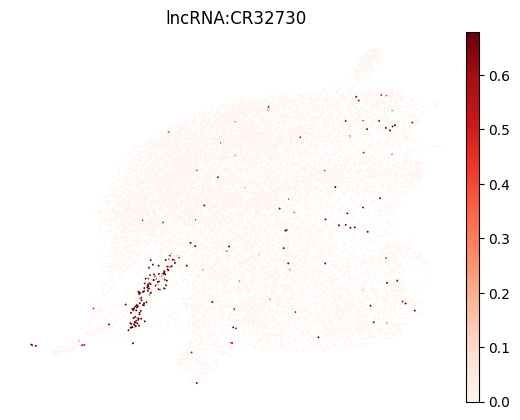

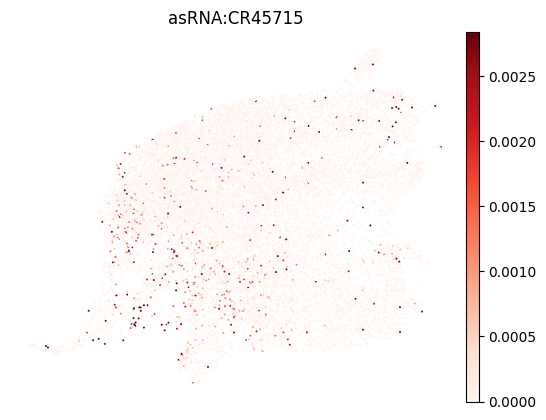

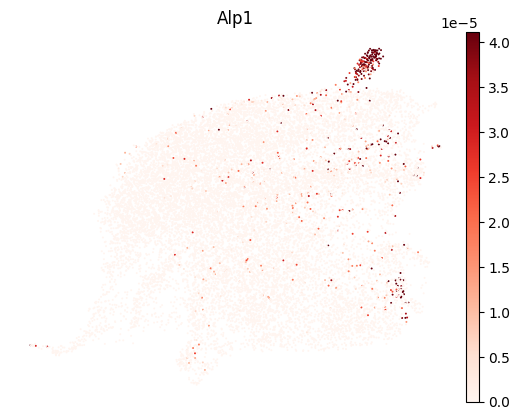

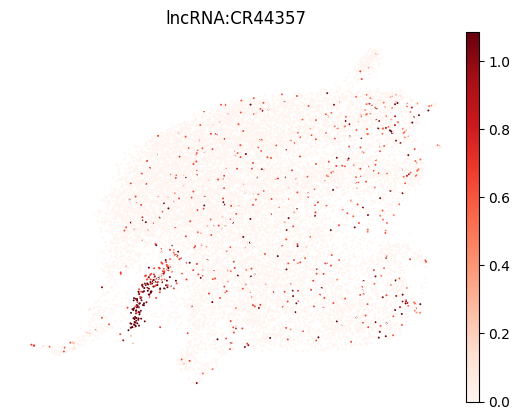

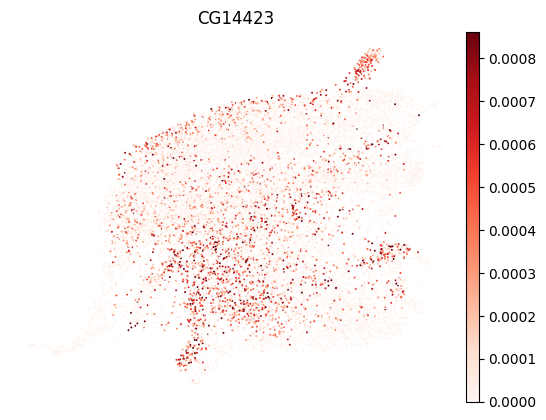

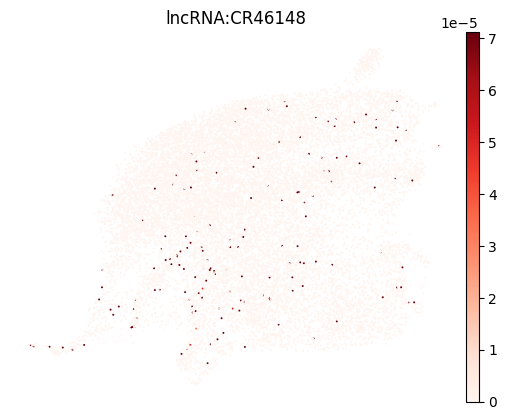






CHORIOGENIC MAIN BODY FOLLICLE CELL AND CORPUS LUTEUM:



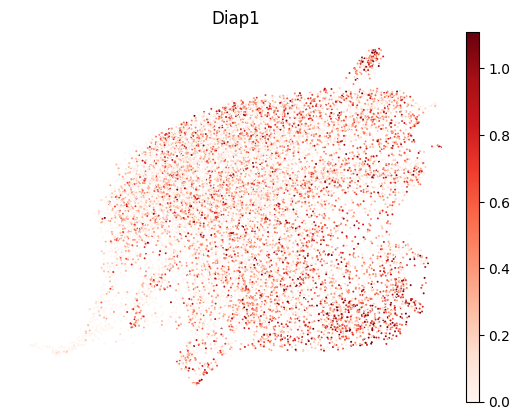

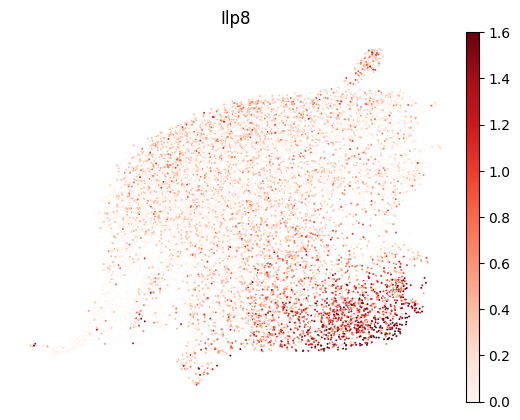






DORSAL APPENDAGE FORMING FOLLICLE CELL:



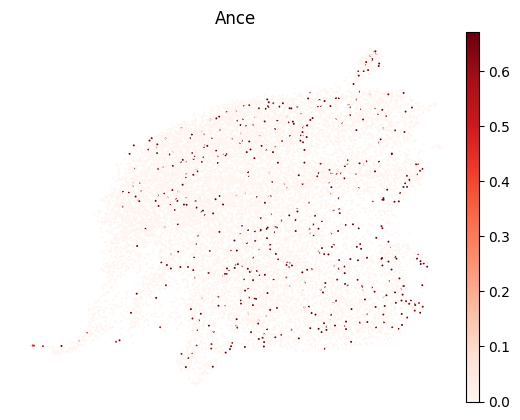

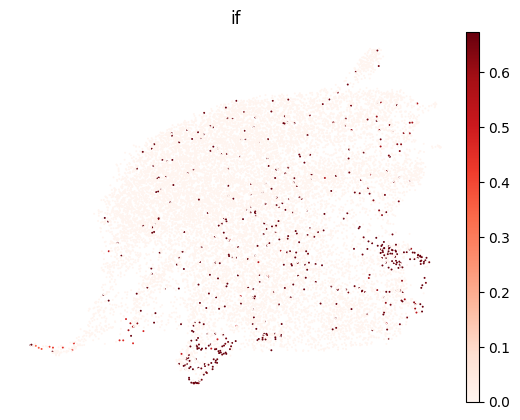






FOLLICLE STEM CELL AND PREFOLLICLE CELL:



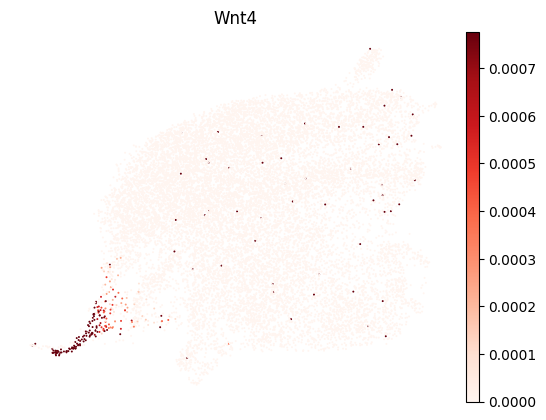

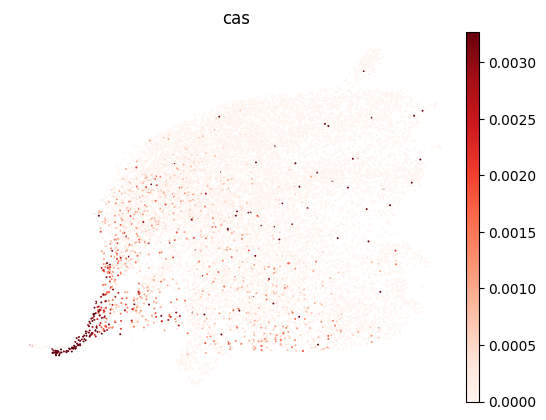

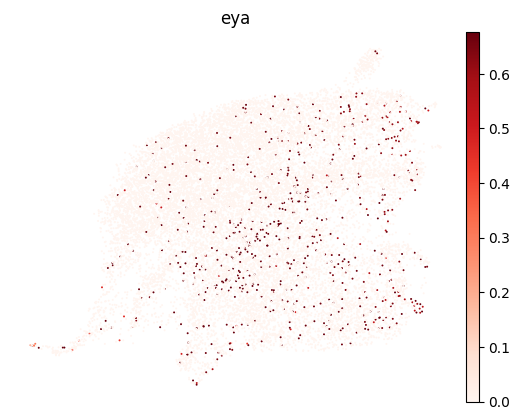

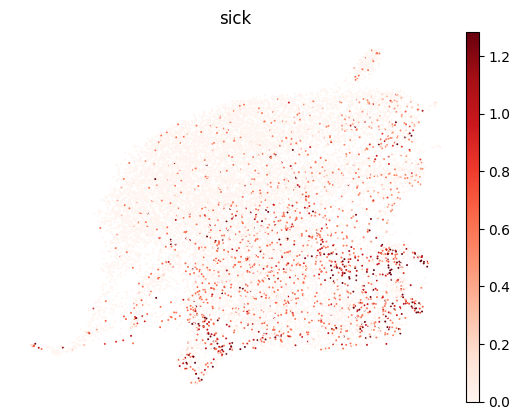






GERM CELL STAGE 4 AND LATER:



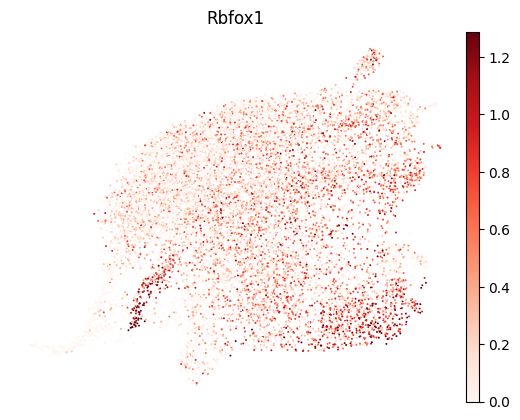






GERMLINE CELL, UNKNOWN STAGE:



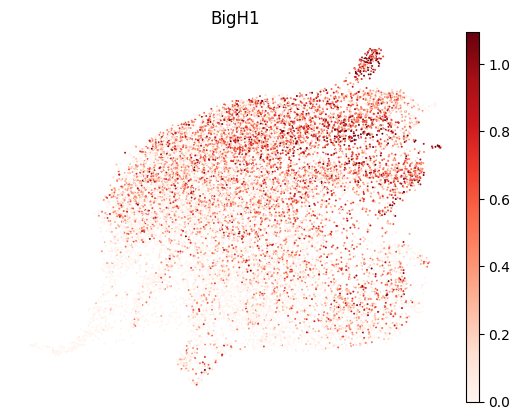

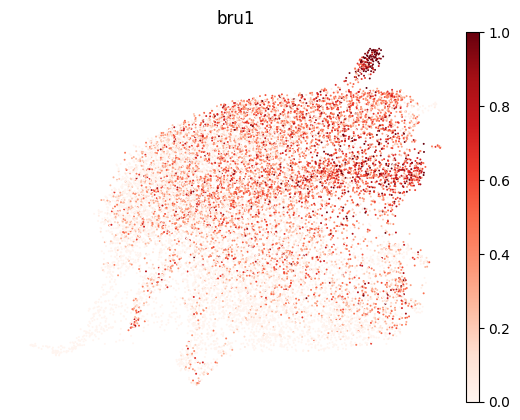

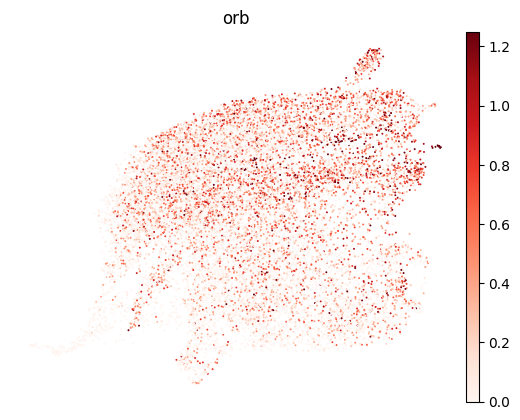

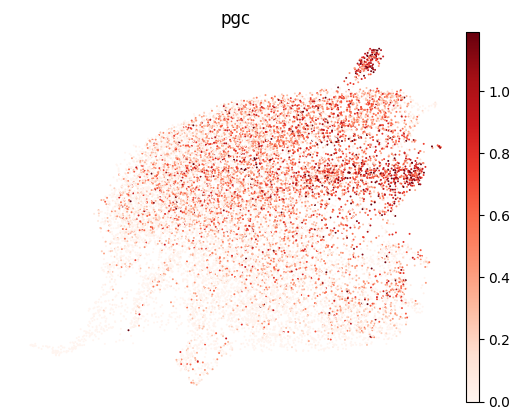






OVARIAN SHEATH MUSCLE:



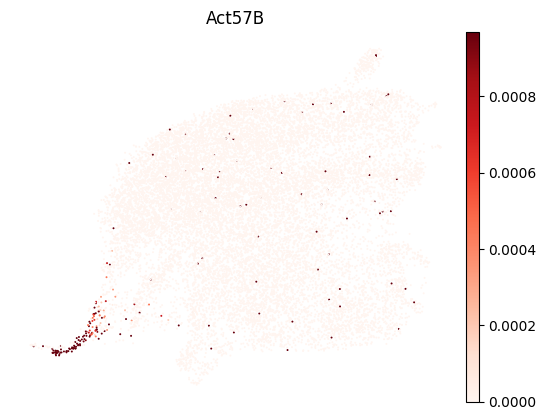

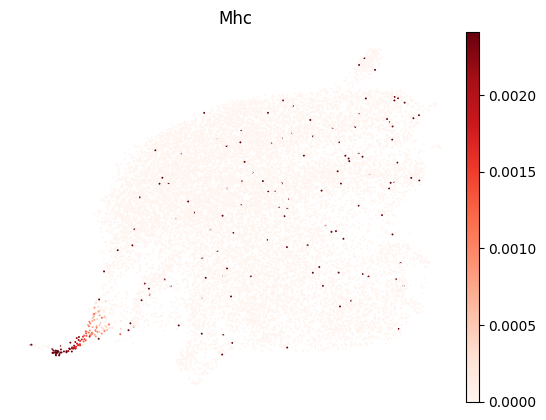

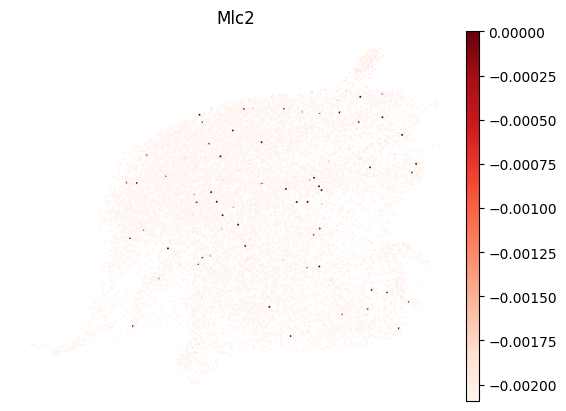

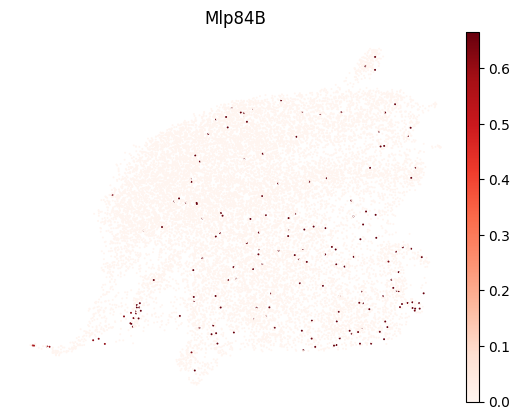






OVIDUCT:



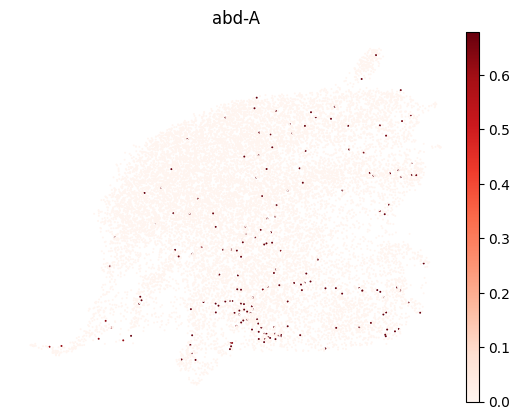

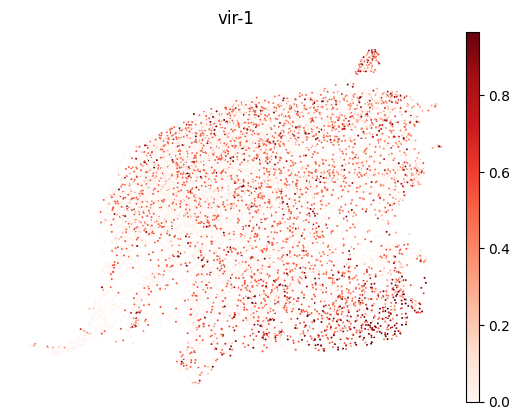






POST-MITOTIC ENDOCYCLING NURSE CELL:



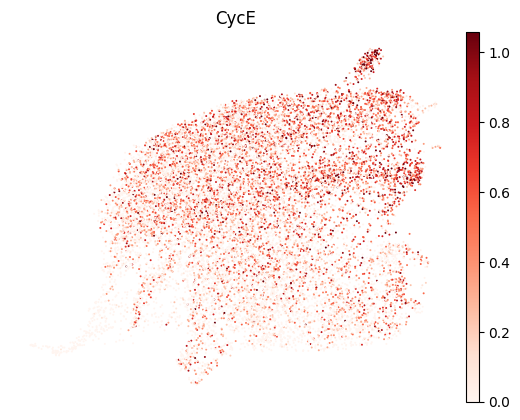






POST-MITOTIC GERM CELL EARLY 16-CELL CYST:



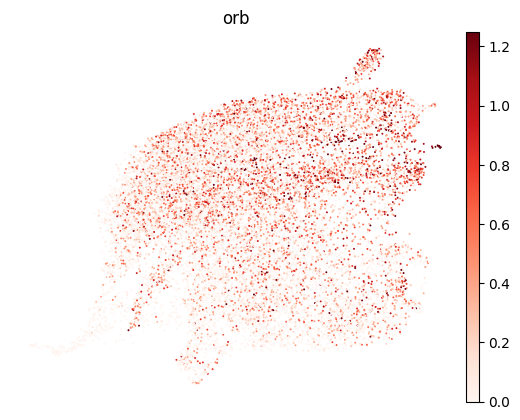






STALK FOLLICLE CELL:



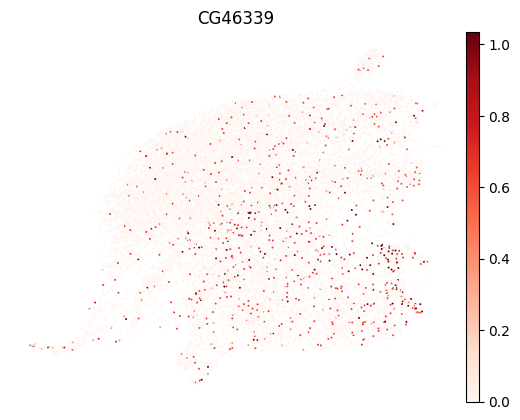

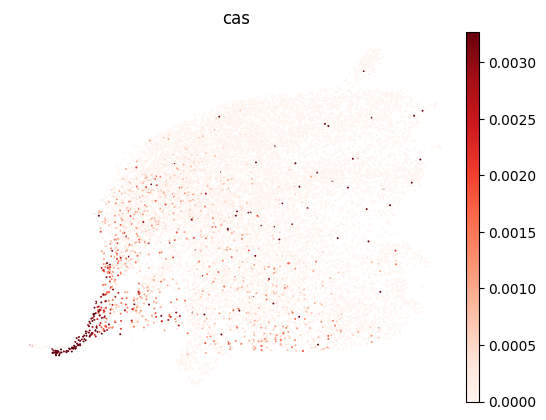

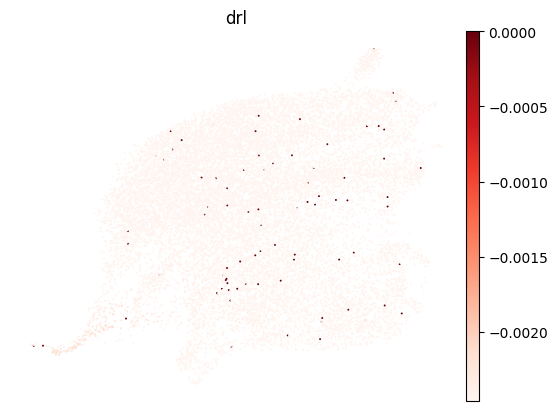

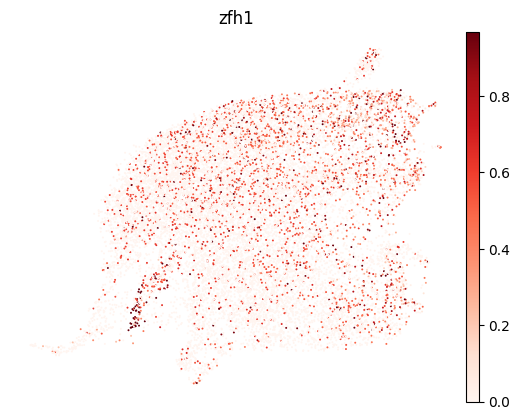






STRETCH FOLLICLE CELL:



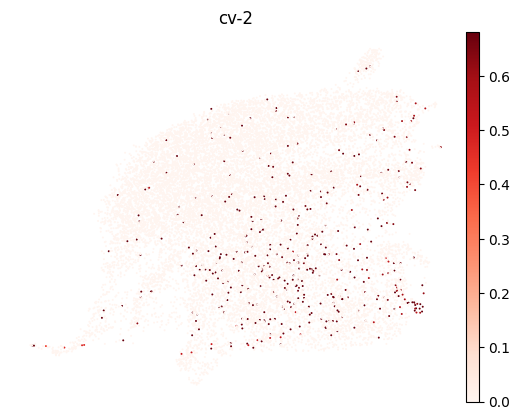

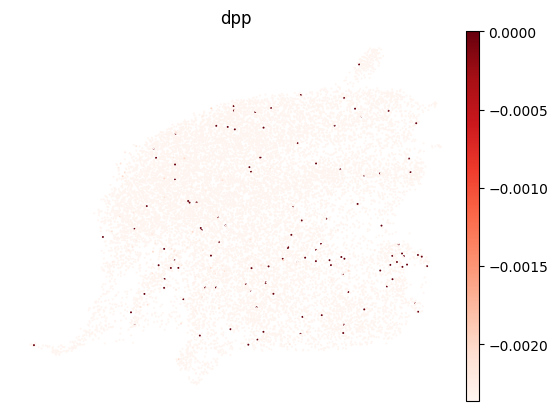






YOUNG GERM CELL:



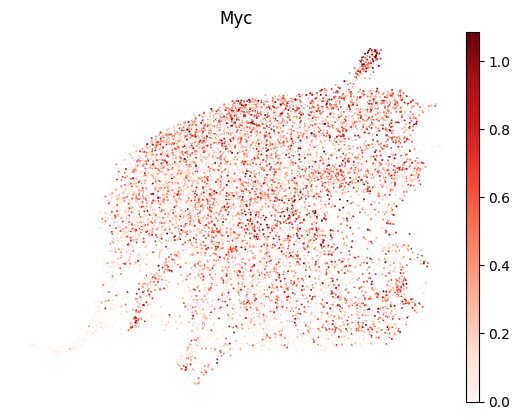

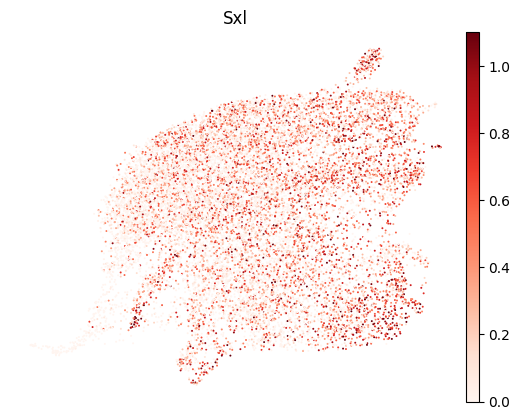

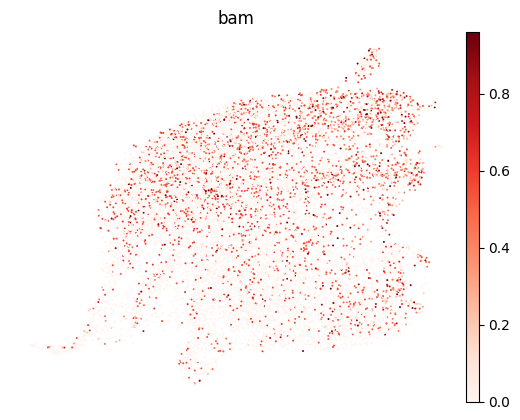

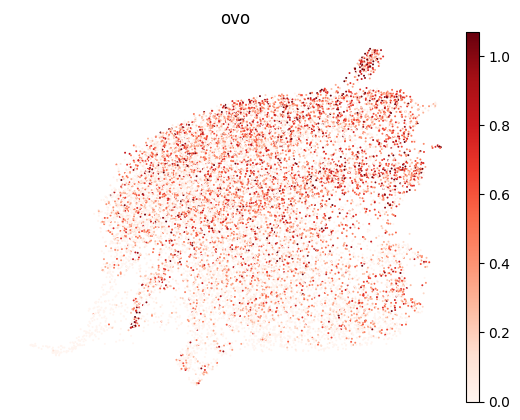

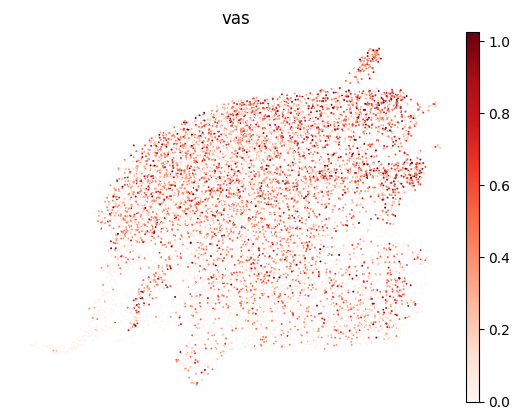






CENTRAL MAIN BODY FOLLICLE CELL CA. ST. 6-8:



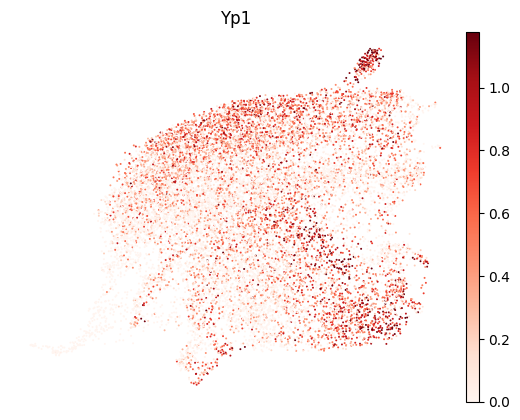

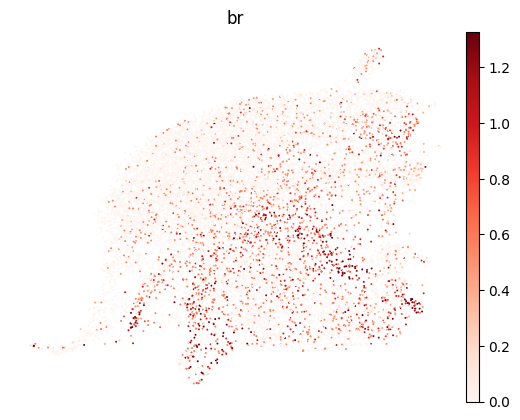

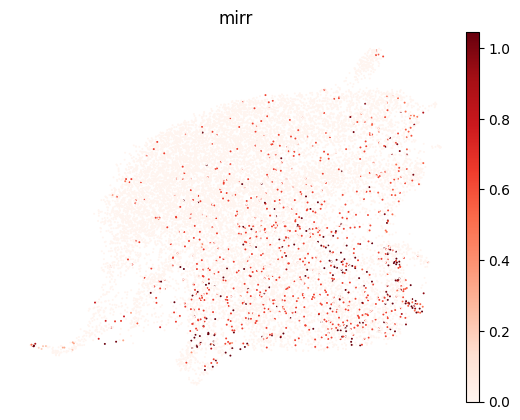






CHORIOGENIC MAIN BODY FOLLICLE CELL ST. 12:



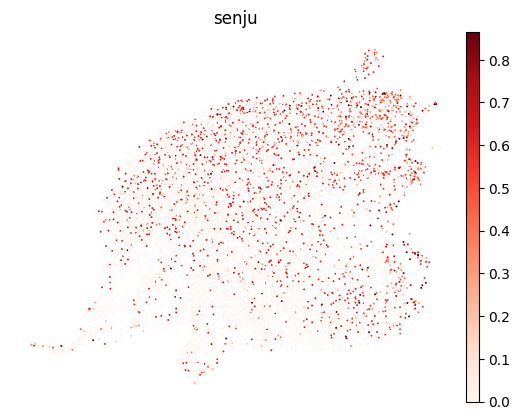

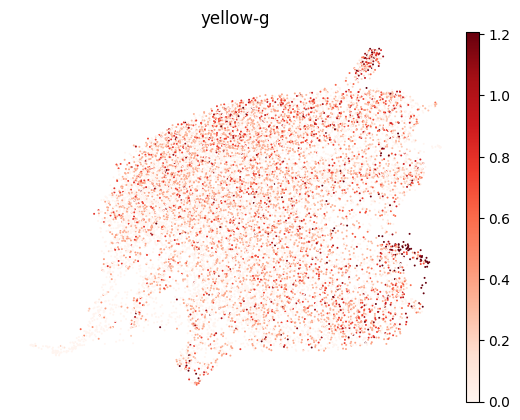

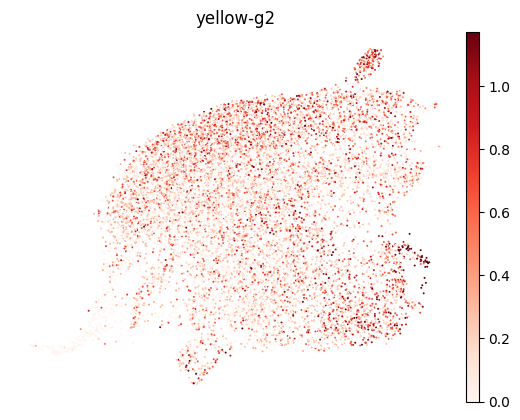






CHORIOGENIC MAIN BODY FOLLICLE CELL ST. 14:



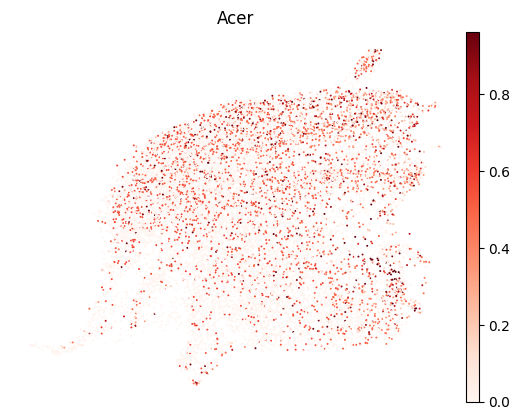

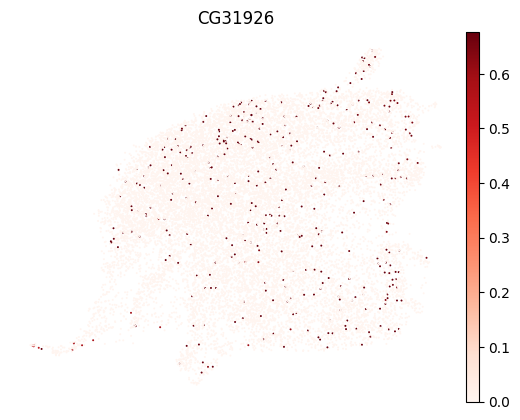

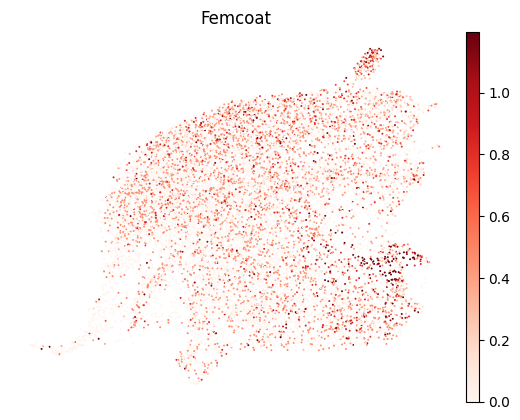






MAIN BODY FOLLICLE CELL CA. UNTIL ST. 5:



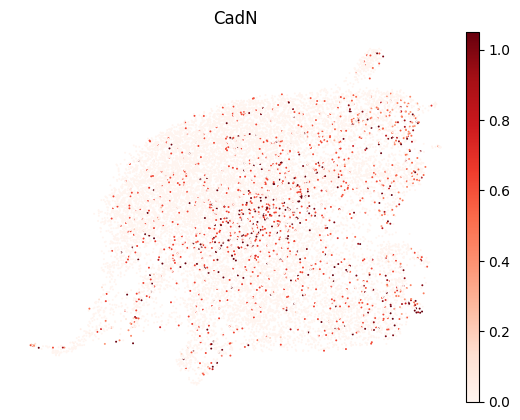

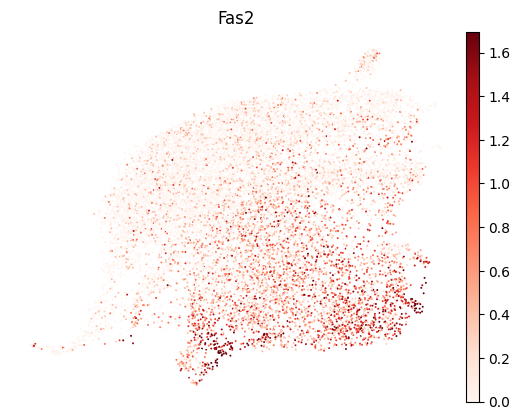

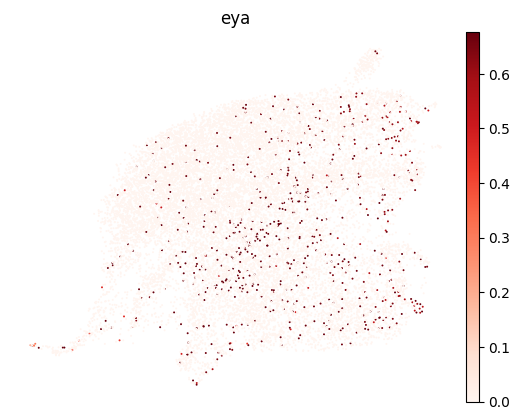






POSTERIOR TERMINAL FOLLICLE CELL CA. ST. 5-8:



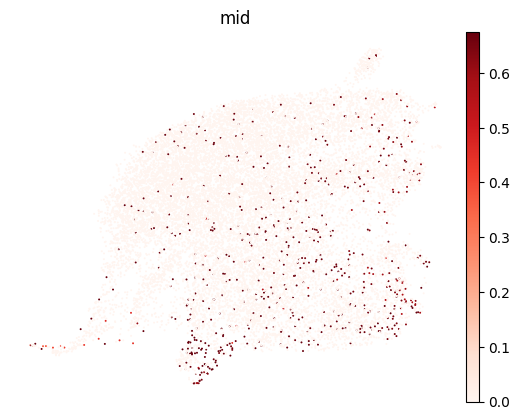

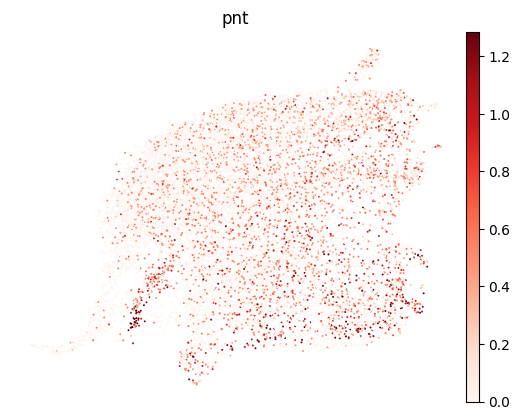

In [ ]:
marker_genes_in_data = {}

for ct, marker_list in marker_dictionary.items():
    markers_found = [marker for marker in marker_list if marker in adata.var.index]
    marker_genes_in_data[ct] = markers_found  

for ct, genes in marker_genes_in_data.items():
    print(f"\n{ct.upper()}:\n")  
    for gene in genes:  
        sc.pl.umap(
            adata,
            color=[gene],  
            vmin=0,
            vmax="p99",  
            sort_order=False,  
            frameon=False,
            cmap="Reds",  
        )
    print("\n" * 3)

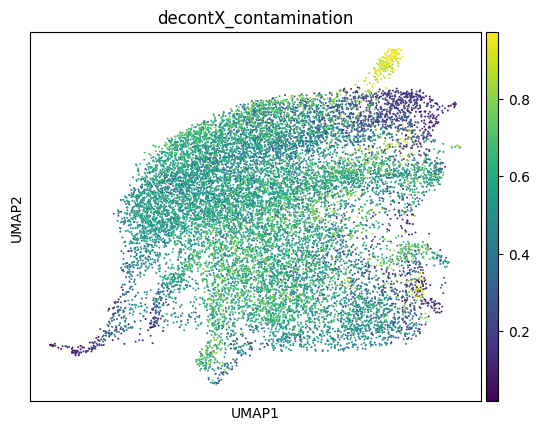

In [ ]:
sc.pl.umap(adata, color=["decontX_contamination"])

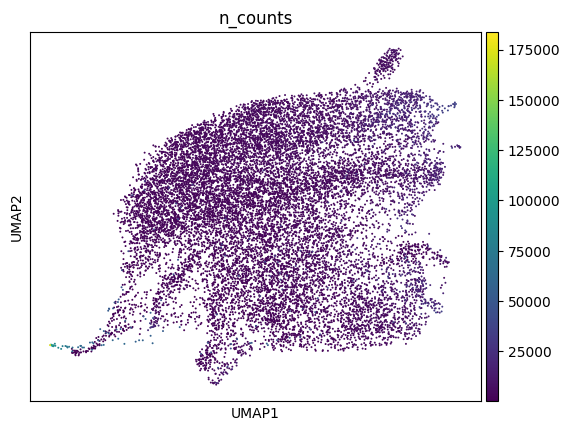

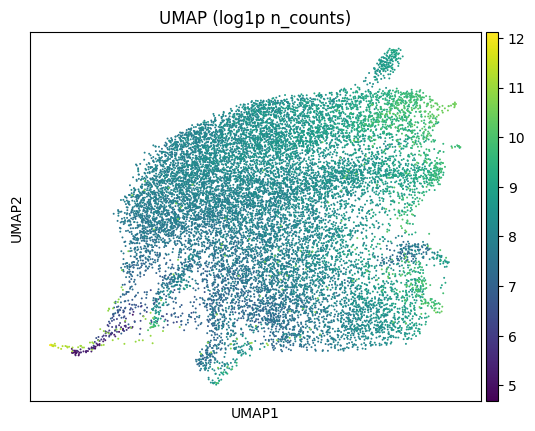

In [211]:
sc.pl.umap(adata, color=["n_counts"])
adata.obs["log_n_counts"] = np.log1p(adata.obs["n_counts"])

sc.pl.umap(
    adata,
    color=["log_n_counts"],
    title="UMAP (log1p n_counts)"
)

In [150]:
sc.tl.rank_genes_groups(adata, groupby="leiden_1_0", method="wilcoxon")

c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_

In [154]:
sc.tl.rank_genes_groups(adata, groupby="leiden_1_0", method="wilcoxon", key_added="wilcoxon")
sc.tl.rank_genes_groups(adata, groupby="leiden_1_0", method="logreg", key_added="logreg")

c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
c:\Users\unite\miniconda3\envs\label_harmony\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_

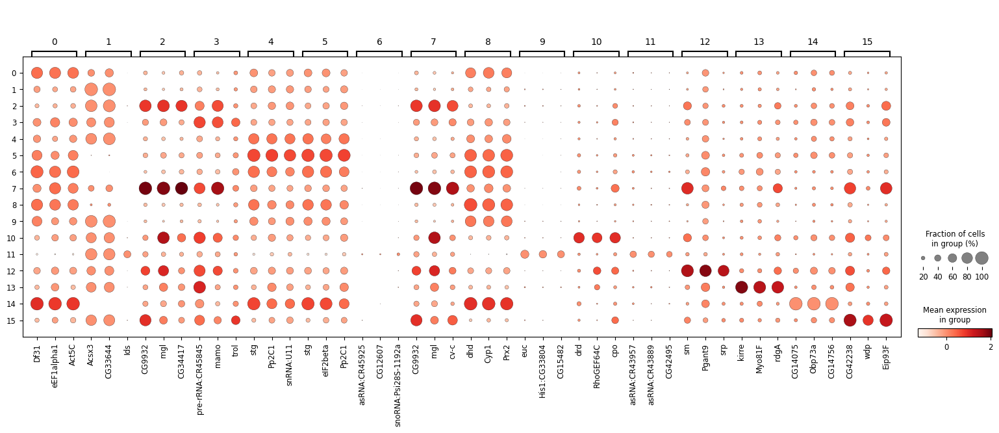

In [162]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=3,                      
    groupby='leiden_1_0',           
    key='wilcoxon',
    #values_to_plot='scores',
    dendrogram=False,
    show=True
)


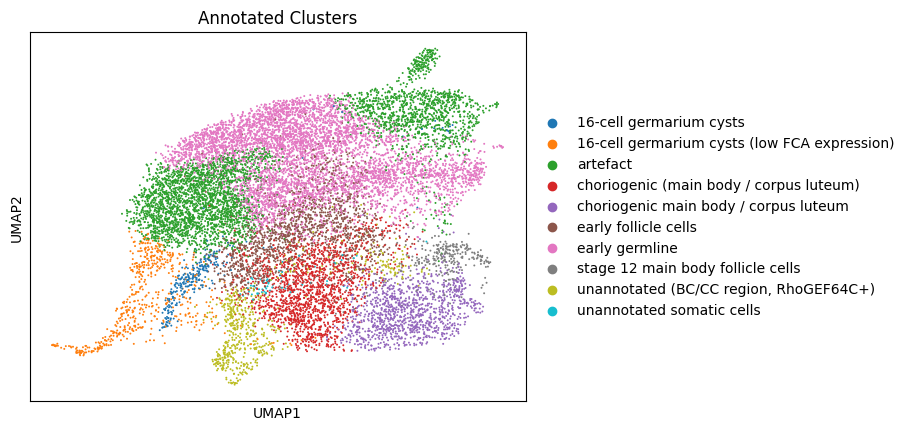

In [ ]:
cluster_annotations = {
    "0":  "early germline",
    "1":  "artefact",  # very low expression
    "2":  "choriogenic main body / corpus luteum",
    "3":  "early follicle cells",
    "4":  "early germline",
    "5":  "early germline",
    "6":  "artefact",  # very low expression
    "7":  "choriogenic main body / corpus luteum",
    "8":  "early germline",
    "9":  "artefact",  # very low expression
    "10": "unannotated (BC/CC region, RhoGEF64C+)",
    "11": "16-cell germarium cysts (low FCA expression)",
    "12": "stage 12 main body follicle cells",
    "13": "16-cell germarium cysts",
    "14": "artefact",  # very low expression
    "15": "unannotated somatic cells"
}
adata.obs["cluster_annotation"] = adata.obs["leiden_1_0"].map(cluster_annotations)
sc.pl.umap(
    adata,
    color="cluster_annotation",
    title="Annotated Clusters"
)
